<center>

# Trabajo Práctico 3: REGISTRACIÓN DE IMÁGENES

## Procesamiento Avanzado de Imágenes en Biomedicina y Biología

### Segundo Cuatrimestre 2024

<table>
      <tr>
        <th>Alumnos</th>
        <th>Legajos</th>
      </tr>
      <tr>
        <td>
          Bajlec, Ivo<br>
          Grau, Gonzalo Andrés<br>
          Neira, Lucas Matias
        </td>
        <td>
          62175<br>
          62259<br>
          61750<br>
        </td>
      </tr>
    </table>

**Docente**: Roberto Sebastián Tomás

**Fecha de entrega**: 

</center>

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import re

from ejercicio1 import Imagen 
from ejercicio1 import Registracion
from ejercicio1 import lista_de_paths
from ejercicio1 import agrupar_paths

from skimage import io, transform, img_as_float
from scipy import fftpack
from scipy.optimize import minimize
from scipy.optimize import differential_evolution
from skimage.metrics import normalized_mutual_information as nmi
from skimage.metrics import structural_similarity as ssim, mean_squared_error as mse

%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### 1- Registre las imágenes contenidas en las carpetas PAIByB-5 y PAIByB-6

#### I. Realice una registración basada en características evaluando los resultados con las métricas de la GUIA I de la imágenes contenidas en “PAIByB-5”¿Qué conclusiones puede sacar al respecto? 

##### Guardo las imagenes 

In [15]:
#extrigo paths 
lista_paths = lista_de_paths('PAIByB-5')
# Agrupar los paths
un_digito, dos_digitos = agrupar_paths(lista_paths)
#aplico la clase Imagen, esta me lee la imagen y calcula los puntos calve 
un_digito_imgs = [Imagen(image) for image in un_digito ]
dos_digito_imgs = [Imagen(image) for image in dos_digitos ]

#### Registración para imágenes del primer grupo

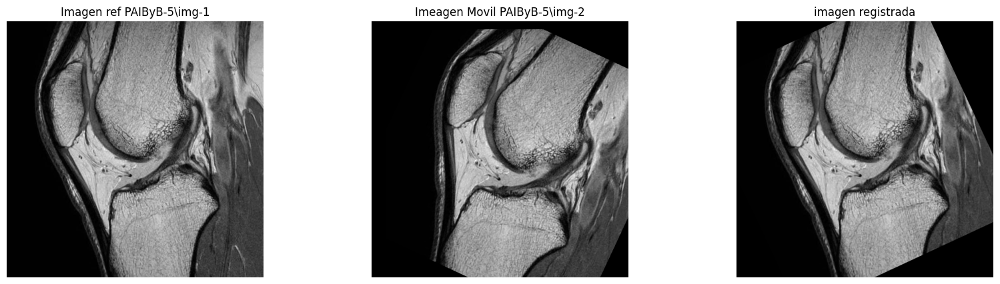

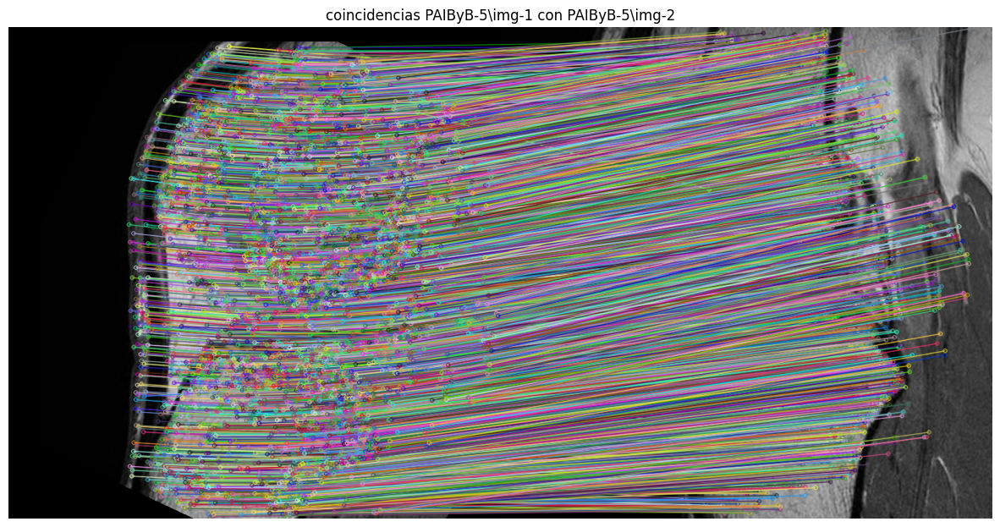

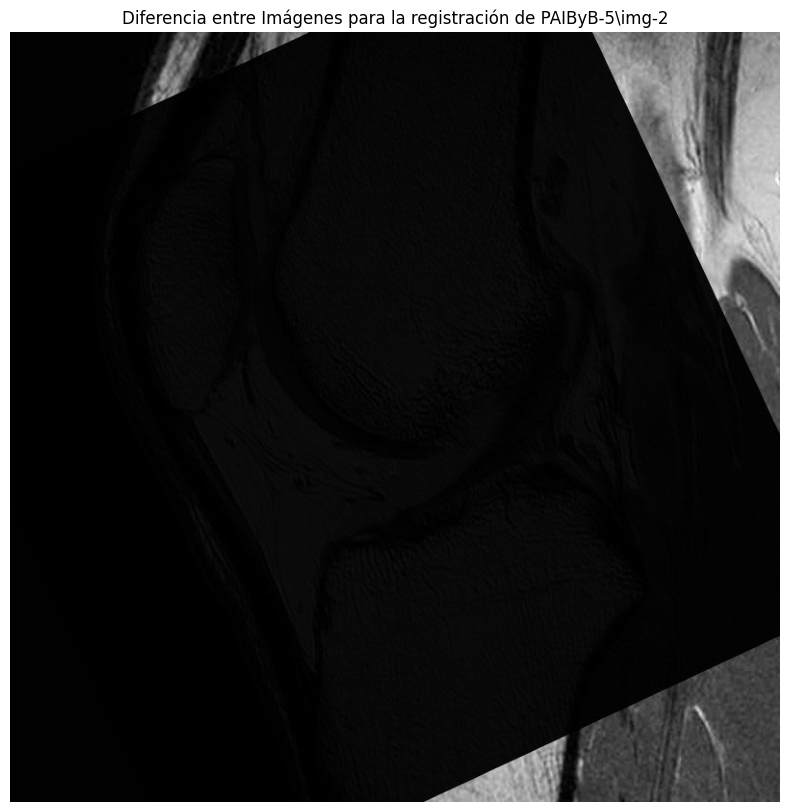

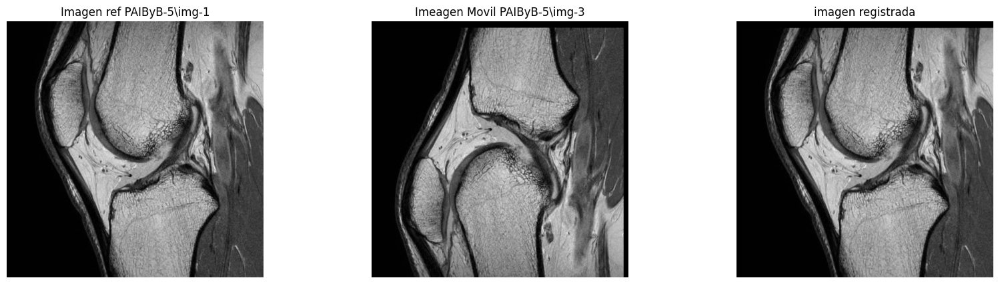

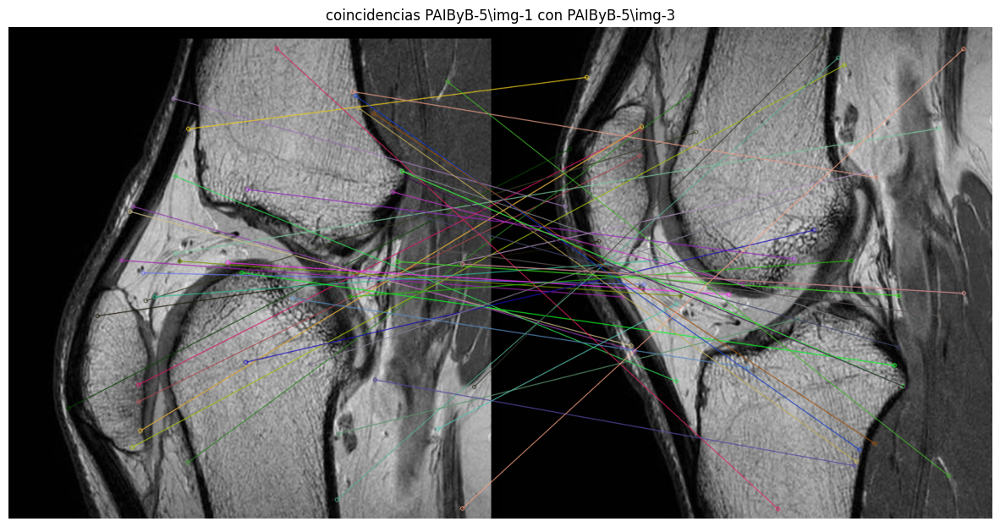

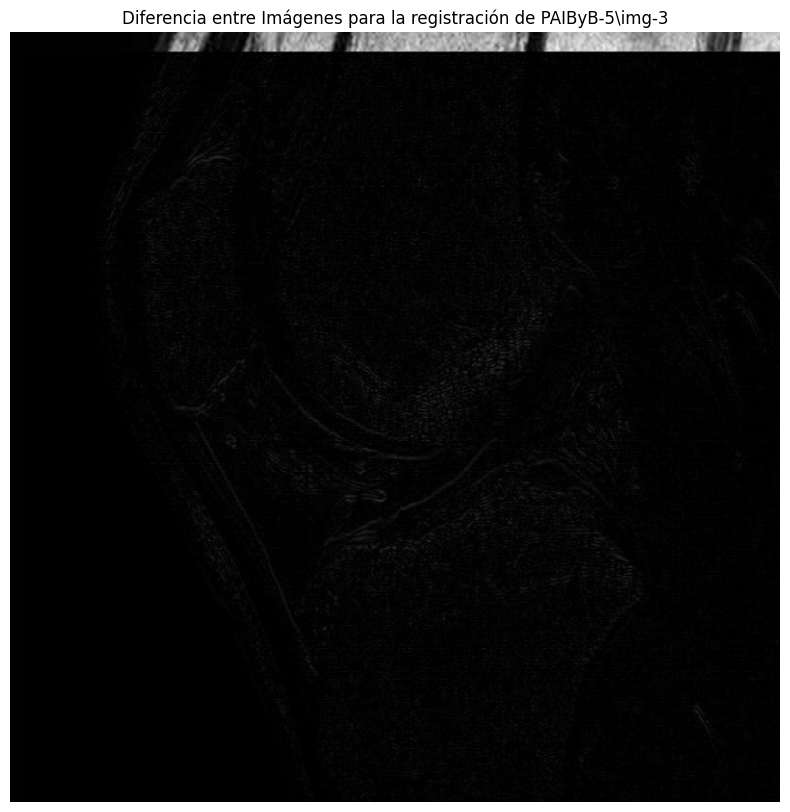

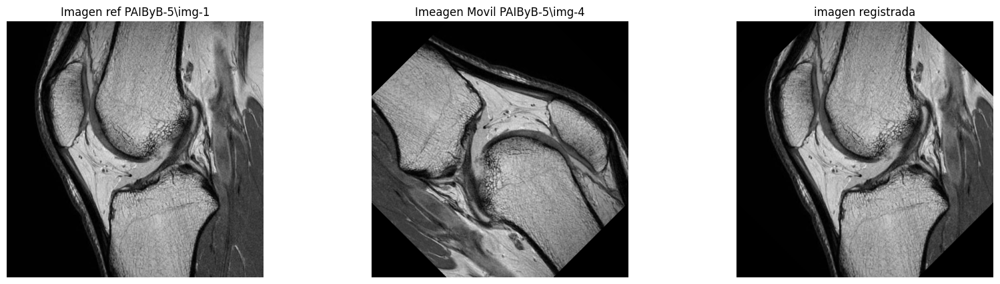

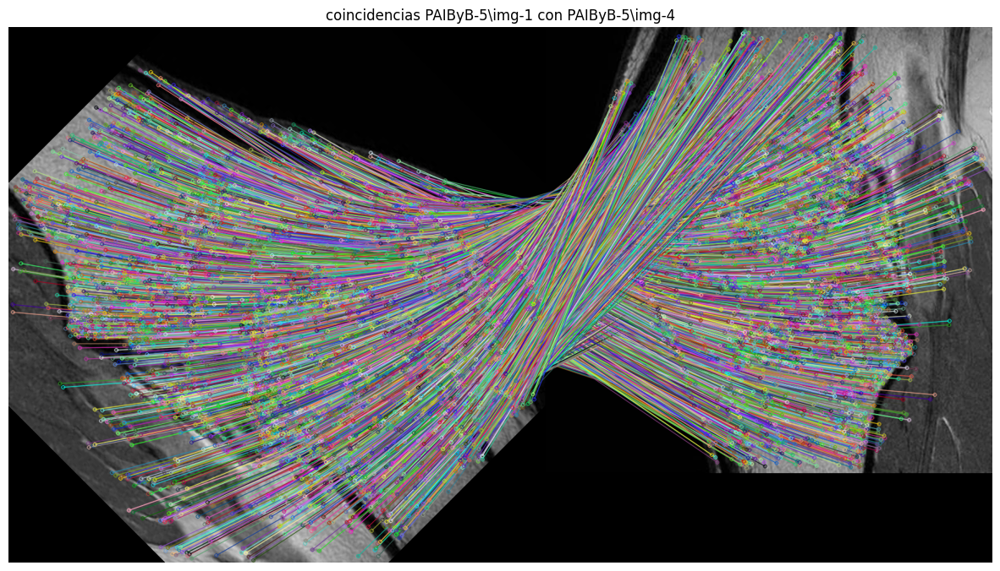

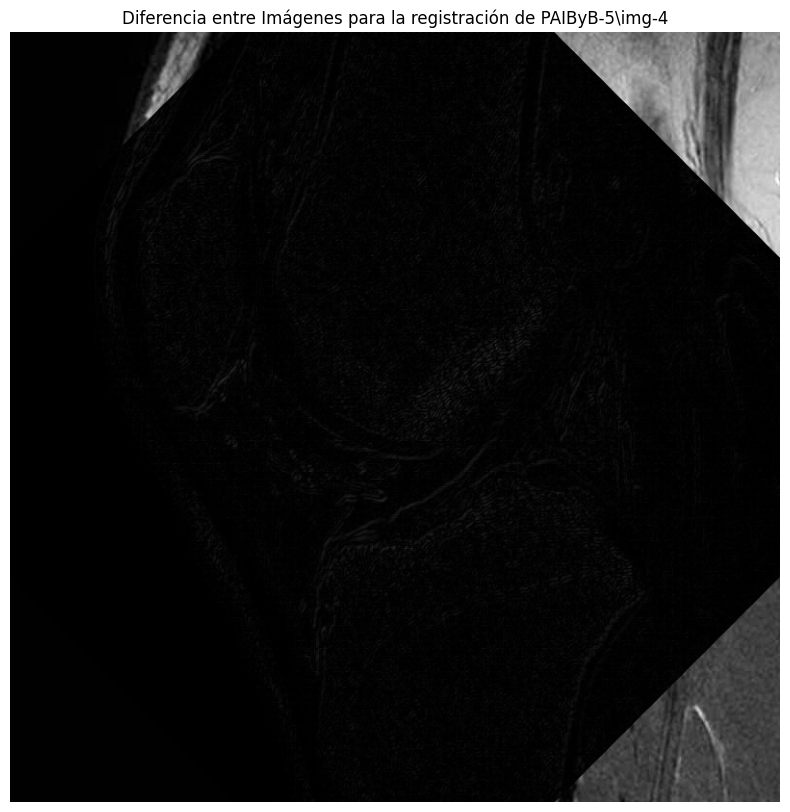

In [16]:
for i in range(1,len(un_digito)):
    # Crea una instancia de Registracion
    prueba = Registracion(imagen_referencia=un_digito_imgs[0], imagen_movil=un_digito_imgs[i])

    # Calcula los matches entre la imagen de referencia y la imagen móvil
    prueba.calcular_matches()

    # Calcula las coincidencias 
    prueba.dibujar_matches()

    # Calcula la homografía basada en los matches filtrados
    prueba.calcular_homografia()

    # Registra la imagen móvil con respecto a la de referencia
    prueba.registrar_imagen()

    #grafico 

    plt.figure(figsize=(20, 5)) 


    plt.subplot(1, 3, 1)
    plt.imshow(prueba.img_ref.imagen, cmap='gray')
    plt.title(f'Imagen ref {prueba.img_ref.nombre}')
    plt.axis('off')


    plt.subplot(1, 3, 2)
    plt.imshow(prueba.img_mov.imagen, cmap='gray')
    plt.title(f'Imeagen Movil {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(prueba.imagen_registrada, cmap='gray')
    plt.title('imagen registrada')
    plt.axis('off')

    # Mostrar el gráfico
    plt.show()

    plt.figure(figsize=(15, 10)) 
    plt.imshow(prueba.coincidencias,cmap= 'gray')
    plt.title(f'coincidencias {prueba.img_ref.nombre} con {prueba.img_mov.nombre}')
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(10,10))
    # Diferencia entre imágenes
    diferencia = cv2.absdiff(prueba.img_ref.imagen, prueba.imagen_registrada)
    plt.imshow(diferencia, cmap='gray')
    plt.title(f'Diferencia entre Imágenes para la registración de {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.show()



#### Registración para imagenes del segundo grupo

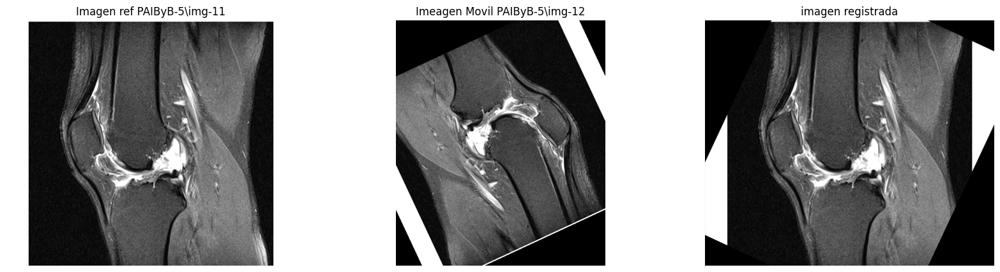

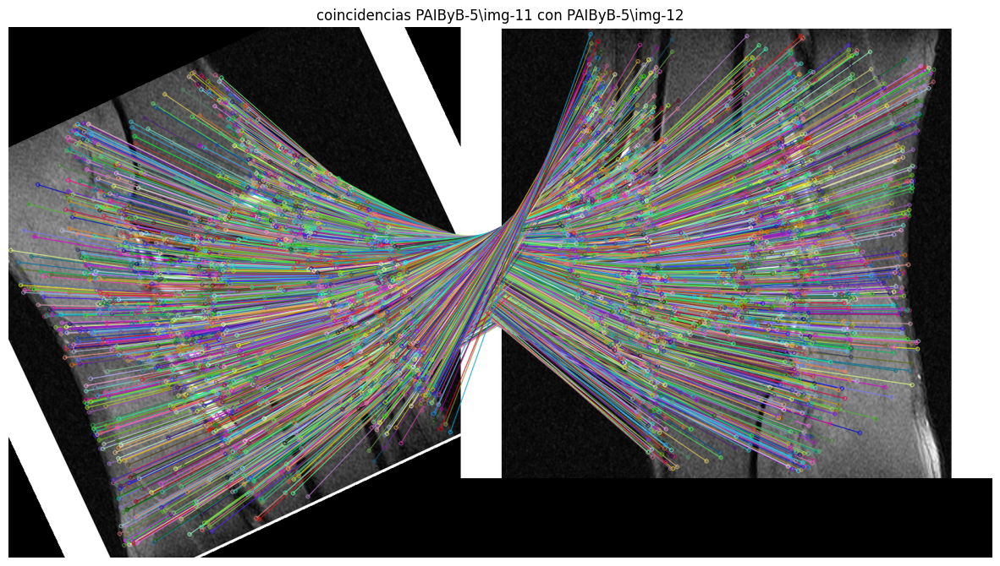

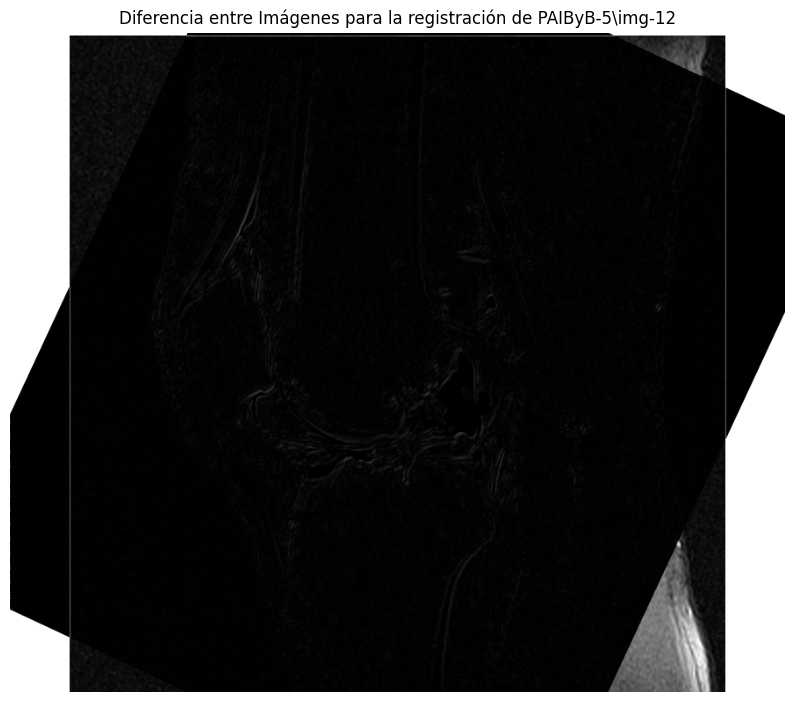

In [17]:
for i in range(1,len(dos_digito_imgs)):
    # Crea una instancia de Registracion
    prueba = Registracion(imagen_referencia=dos_digito_imgs[0], imagen_movil=dos_digito_imgs[i])

    # Calcula los matches entre la imagen de referencia y la imagen móvil
    prueba.calcular_matches()

    # Calcula las coincidencias 
    prueba.dibujar_matches()

    # Calcula la homografía basada en los matches filtrados
    prueba.calcular_homografia()

    # Registra la imagen móvil con respecto a la de referencia
    prueba.registrar_imagen()

    #grafico 

    plt.figure(figsize=(20, 5)) 


    plt.subplot(1, 3, 1)
    plt.imshow(prueba.img_ref.imagen, cmap='gray')
    plt.title(f'Imagen ref {prueba.img_ref.nombre}')
    plt.axis('off')


    plt.subplot(1, 3, 2)
    plt.imshow(prueba.img_mov.imagen, cmap='gray')
    plt.title(f'Imeagen Movil {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(prueba.imagen_registrada, cmap='gray')
    plt.title('imagen registrada')
    plt.axis('off')

    # Mostrar el gráfico
    plt.show()

    plt.figure(figsize=(15, 10)) 
    plt.imshow(prueba.coincidencias,cmap= 'gray')
    plt.title(f'coincidencias {prueba.img_ref.nombre} con {prueba.img_mov.nombre}')
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(10,10))
    # Diferencia entre imágenes
    diferencia = cv2.absdiff(prueba.img_ref.imagen, prueba.imagen_registrada)
    plt.imshow(diferencia, cmap='gray')
    plt.title(f'Diferencia entre Imágenes para la registración de {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.show()




#### II. Realice una registración basada en características evaluando los resultados con las métricas de la GUIA I de la imagenes contenidas en “PAIByB-6”¿Qué conclusiones puede sacar al respecto? 

##### Guardo las imagenes

In [18]:
#extrigo paths 
lista_paths2 = lista_de_paths('PAIByB-6')
# Agrupar los paths
un_digito2, dos_digitos2 = agrupar_paths(lista_paths2)
#aplico la clase Imagen, esta me lee la imagen y calcula los puntos calve 
un_digito_imgs2 = [Imagen(image) for image in un_digito2 ]
dos_digito_imgs2 = [Imagen(image) for image in dos_digitos2 ]

##### Registracion para el primer grupo 

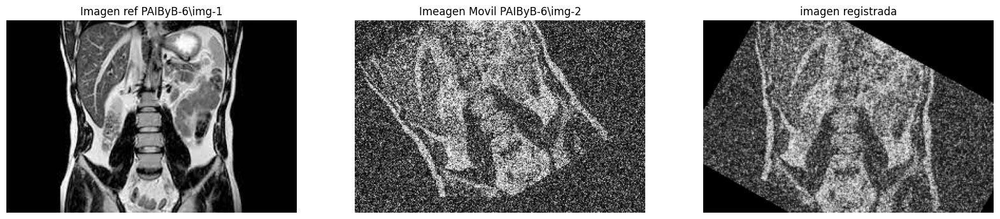

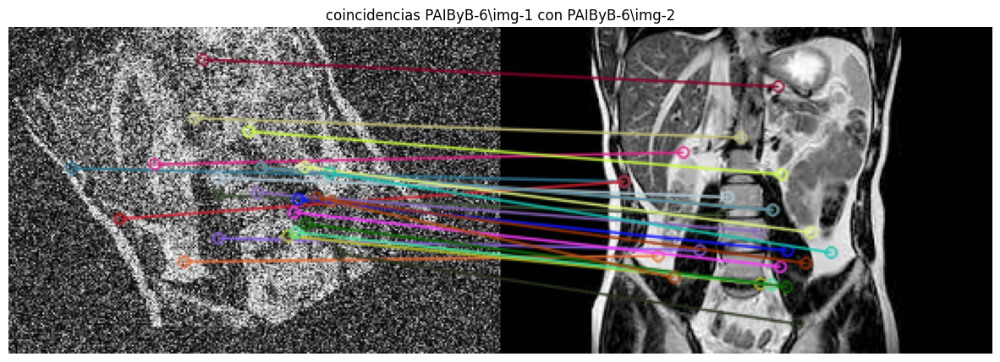

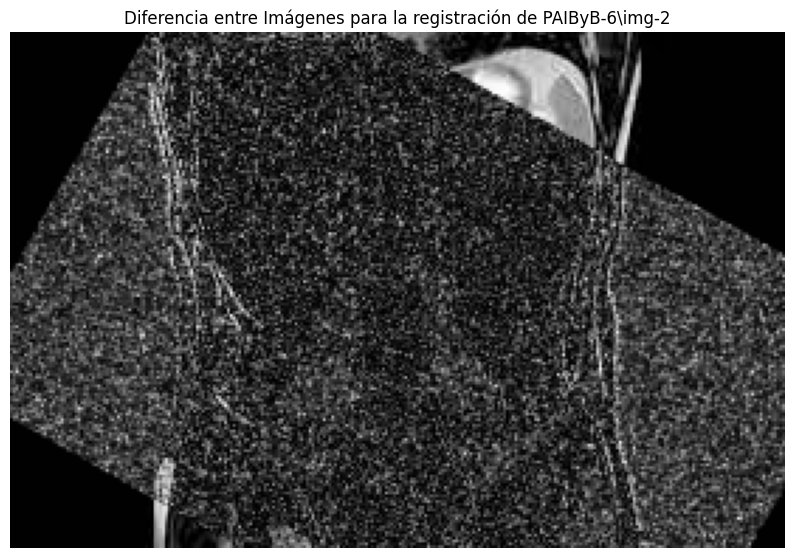

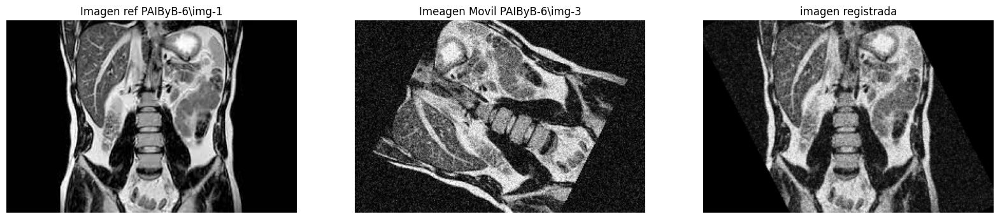

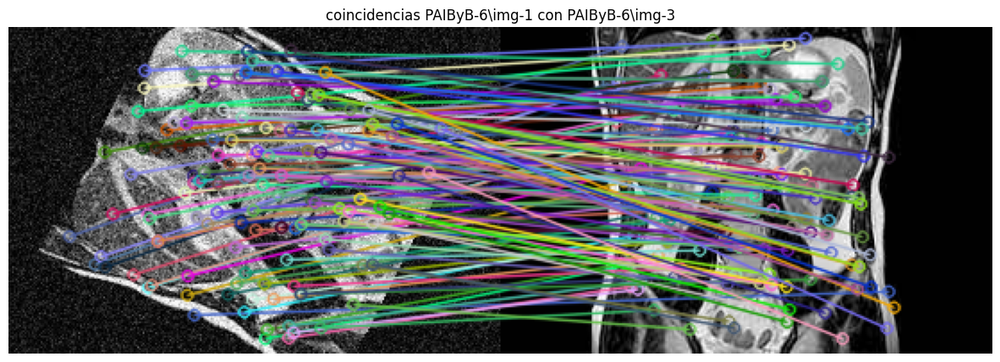

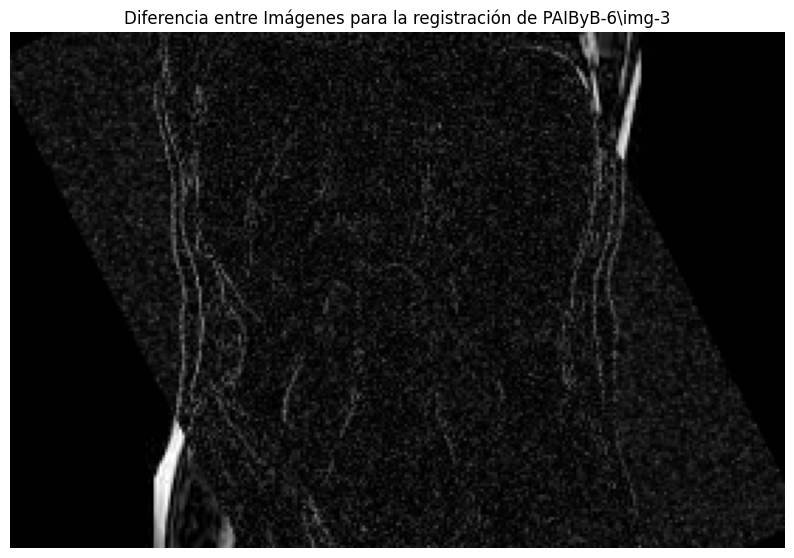

In [19]:
for i in range(1,len(un_digito2)):
    # Crea una instancia de Registracion
    prueba = Registracion(imagen_referencia=un_digito_imgs2[0], imagen_movil=un_digito_imgs2[i])

    # Calcula los matches entre la imagen de referencia y la imagen móvil
    prueba.calcular_matches()

    # Calcula las coincidencias 
    prueba.dibujar_matches()

    # Calcula la homografía basada en los matches filtrados
    prueba.calcular_homografia()

    # Registra la imagen móvil con respecto a la de referencia
    prueba.registrar_imagen()

    #grafico 

    plt.figure(figsize=(20, 5)) 


    plt.subplot(1, 3, 1)
    plt.imshow(prueba.img_ref.imagen, cmap='gray')
    plt.title(f'Imagen ref {prueba.img_ref.nombre}')
    plt.axis('off')


    plt.subplot(1, 3, 2)
    plt.imshow(prueba.img_mov.imagen, cmap='gray')
    plt.title(f'Imeagen Movil {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(prueba.imagen_registrada, cmap='gray')
    plt.title('imagen registrada')
    plt.axis('off')

    # Mostrar el gráfico
    plt.show()

    plt.figure(figsize=(15, 10)) 
    plt.imshow(prueba.coincidencias,cmap= 'gray')
    plt.title(f'coincidencias {prueba.img_ref.nombre} con {prueba.img_mov.nombre}')
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(10,10))
    # Diferencia entre imágenes
    diferencia = cv2.absdiff(prueba.img_ref.imagen, prueba.imagen_registrada)
    plt.imshow(diferencia, cmap='gray')
    plt.title(f'Diferencia entre Imágenes para la registración de {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.show()



##### Registracion para el segundo grupo 

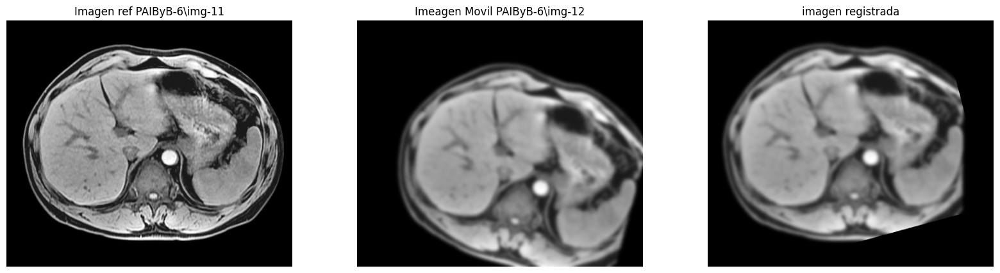

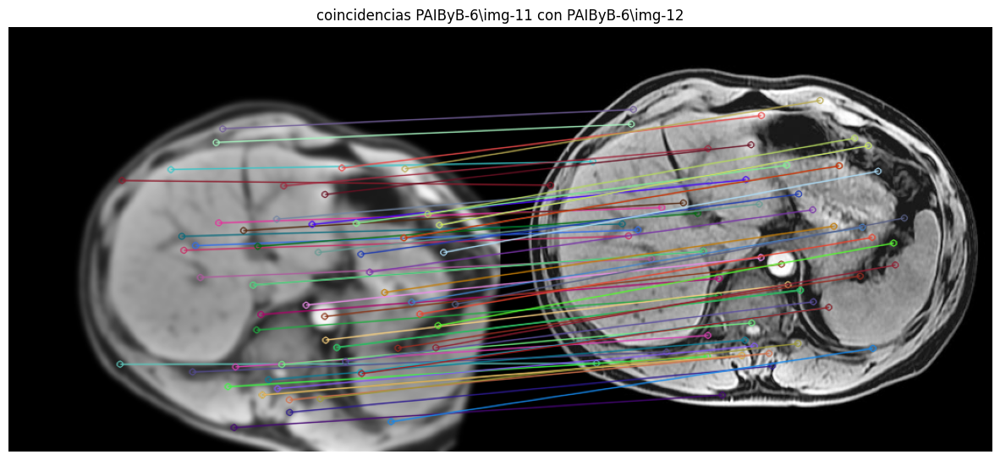

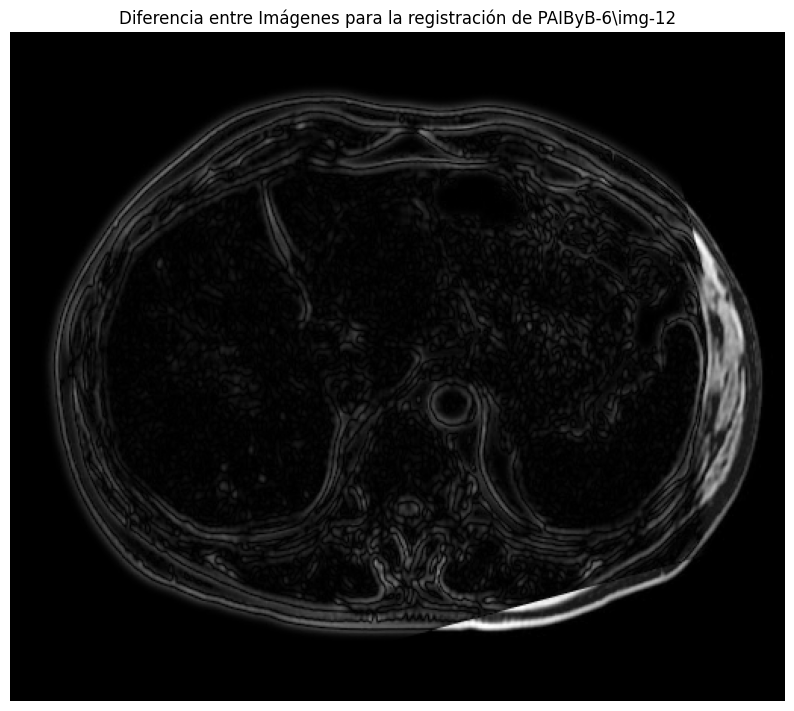

In [20]:
for i in range(1,len(dos_digitos2)):
    # Crea una instancia de Registracion
    prueba = Registracion(imagen_referencia=dos_digito_imgs2[0], imagen_movil=dos_digito_imgs2[i])

    # Calcula los matches entre la imagen de referencia y la imagen móvil
    prueba.calcular_matches()

    # Calcula las coincidencias 
    prueba.dibujar_matches()

    # Calcula la homografía basada en los matches filtrados
    prueba.calcular_homografia()

    # Registra la imagen móvil con respecto a la de referencia
    prueba.registrar_imagen()

    #grafico 

    plt.figure(figsize=(20, 5)) 


    plt.subplot(1, 3, 1)
    plt.imshow(prueba.img_ref.imagen, cmap='gray')
    plt.title(f'Imagen ref {prueba.img_ref.nombre}')
    plt.axis('off')


    plt.subplot(1, 3, 2)
    plt.imshow(prueba.img_mov.imagen, cmap='gray')
    plt.title(f'Imeagen Movil {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(prueba.imagen_registrada, cmap='gray')
    plt.title('imagen registrada')
    plt.axis('off')

    # Mostrar el gráfico
    plt.show()

    plt.figure(figsize=(15, 10)) 
    plt.imshow(prueba.coincidencias,cmap= 'gray')
    plt.title(f'coincidencias {prueba.img_ref.nombre} con {prueba.img_mov.nombre}')
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(10,10))
    # Diferencia entre imágenes
    diferencia = cv2.absdiff(prueba.img_ref.imagen, prueba.imagen_registrada)
    plt.imshow(diferencia, cmap='gray')
    plt.title(f'Diferencia entre Imágenes para la registración de {prueba.img_mov.nombre}')
    plt.axis('off')

    plt.show()



#### III. Realice una registración basada en características evaluando los resultados con las métricas de la GUIA I de la imagenes contenidas en “PAIByB-6” previamente pre-procesadas de la manera que crea conveniente ¿Qué conclusiones puede sacar al respecto? 